In [1]:
import pandas as pd

# Load the dataset
file_path = '/Users/anuragmishra/Downloads/foml/sample.xlsx'
data = pd.read_excel(file_path)

# Display the first few rows of the dataset to understand its structure
data.head()


,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1743-11-01,6.068,1.737,√Örhus,Denmark,57.05N,10.33E
1,1743-12-01,NaN,NaN,√Örhus,Denmark,57.05N,10.33E
2,1744-01-01,NaN,NaN,√Örhus,Denmark,57.05N,10.33E
3,1744-02-01,NaN,NaN,√Örhus,Denmark,57.05N,10.33E
4,1744-03-01,NaN,NaN,√Örhus,Denmark,57.05N,10.33E


In [2]:
# Filter data for the city 'Århus'
arhus_data = data[data['City'] == '√Örhus']

# Convert 'dt' to datetime and set as index
arhus_data['dt'] = pd.to_datetime(arhus_data['dt'])
arhus_data.set_index('dt', inplace=True)

# Handling missing values by forward filling
arhus_data['AverageTemperature'] = arhus_data['AverageTemperature'].fillna(method='ffill')

# Resample data to monthly frequency, taking the mean (this step may be redundant if data is already monthly)
arhus_data_monthly = arhus_data['AverageTemperature'].resample('M').mean()

arhus_data_monthly.head()


/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3170169041.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arhus_data['dt'] = pd.to_datetime(arhus_data['dt'])
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3170169041.py:9: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  arhus_data['AverageTemperature'] = arhus_data['AverageTemperature'].fillna(method='ffill')
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3170169041.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

dt
1743-11-30    6.068
1743-12-31    6.068
1744-01-31    6.068
1744-02-29    6.068
1744-03-31    6.068
Freq: ME, Name: AverageTemperature, dtype: float64

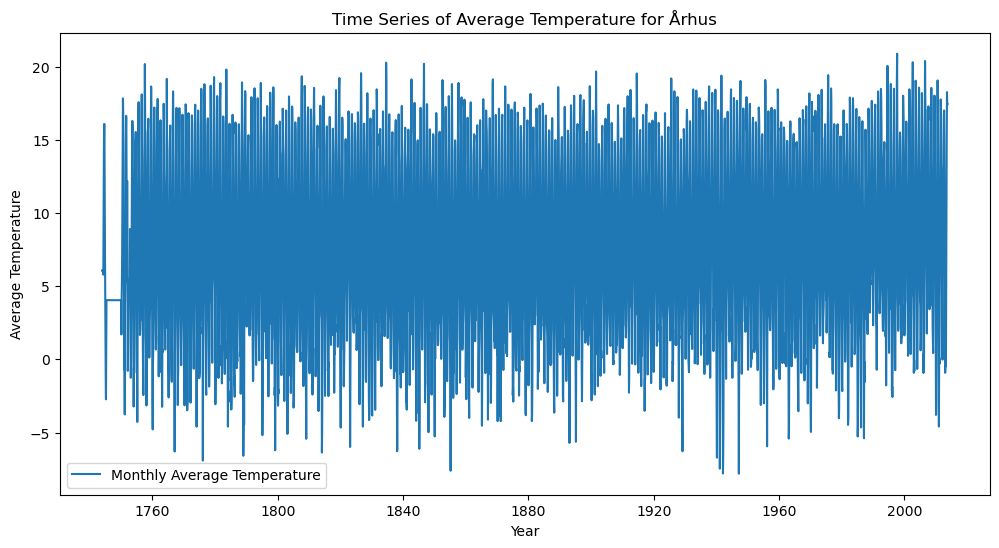

ADF Statistic: -7.714333261714973
p-value: 1.2397649736482703e-11
Critical Values:
	1%: -3.4323887965708293
	5%: -2.8624408170993605
	10%: -2.5672495249463805


In [3]:
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller

# Function to perform the Augmented Dickey-Fuller test
def adf_test(series):
    result = adfuller(series, autolag='AIC')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')

# Plotting the data
plt.figure(figsize=(12, 6))
plt.plot(arhus_data_monthly, label='Monthly Average Temperature')
plt.title('Time Series of Average Temperature for Århus')
plt.xlabel('Year')
plt.ylabel('Average Temperature')
plt.legend()
plt.show()

# Perform ADF test
adf_test(arhus_data_monthly)


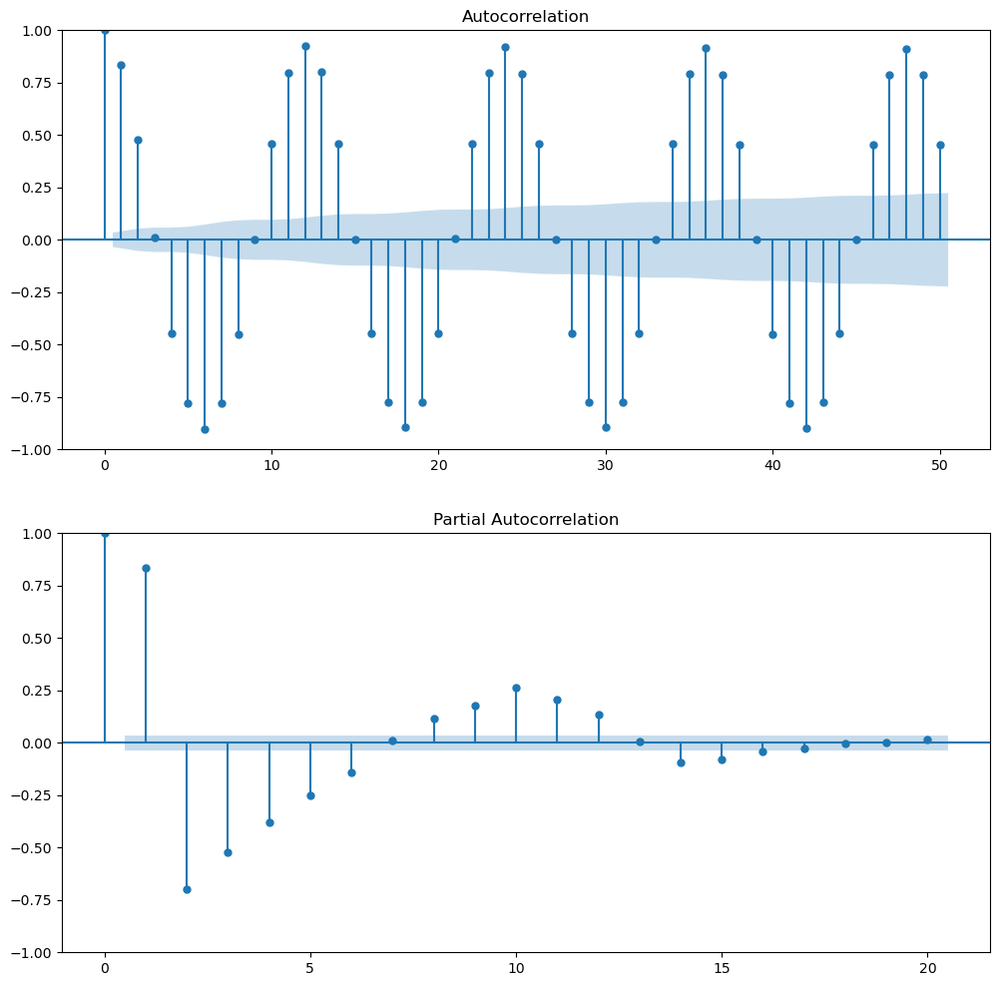

In [4]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF and PACF
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

plot_acf(arhus_data_monthly, ax=ax1, lags=50)  # ACF plot
plot_pacf(arhus_data_monthly, ax=ax2, lags=20)  # PACF plot

plt.show()


In [6]:
# Fit an ARIMA(1,0,1) model

from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima

model = ARIMA(arhus_data_monthly, order=(1, 0, 1))
model_fit = model.fit()

# Display the summary of the model
model_fit.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:     AverageTemperature   No. Observations:                 3239
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -8275.106
Date:                Thu, 18 Apr 2024   AIC                          16558.213
Time:                        22:51:18   BIC                          16582.545
Sample:                    11-30-1743   HQIC                         16566.931
                         - 09-30-2013                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.6330      0.327     23.344      0.000       6.992       8.274
ar.L1          0.7515      0.014     52.436      0.000       0.723       0.780
ma.L1          0.4598      0.018     25.901      0.000       0.425       0.495
sigma2         9.6919      0.262     36.991      0.000       9.178      10.205
===================================================================================
Ljung-Box (L1) (Q):                  95.78   Jarque-Bera (JB):                 7.32
Prob(Q):                              0.00   Prob(JB):                         0.03
Heteroskedasticity (H):               0.90   Skew:                            -0.06
Prob(H) (two-sided):                  0.07   Kurtosis:                         2.80
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

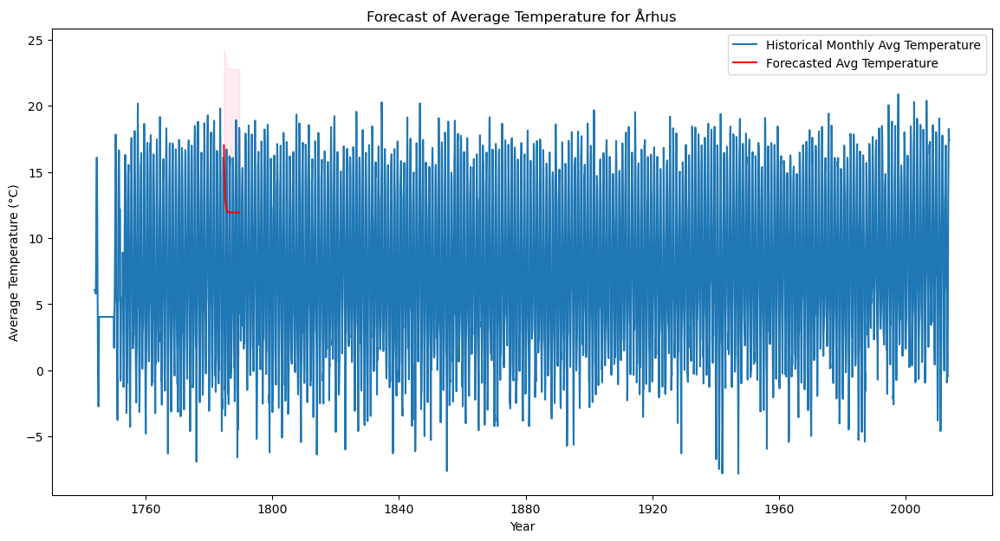

In [19]:
# Forecast the next 60 months (5 years)
forecast = model_fit.get_forecast(steps=60)
forecast_df = forecast.summary_frame()

# Plotting the forecast along with the historical data
plt.figure(figsize=(14, 7))
plt.plot(arhus_data_monthly, label='Historical Monthly Avg Temperature')
plt.plot(forecast_df['mean'], label='Forecasted Avg Temperature', color='red')
plt.fill_between(forecast_df.index, forecast_df['mean_ci_lower'], forecast_df['mean_ci_upper'], color='pink', alpha=0.3)
plt.title('Forecast of Average Temperature for Århus')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.legend()
plt.show()


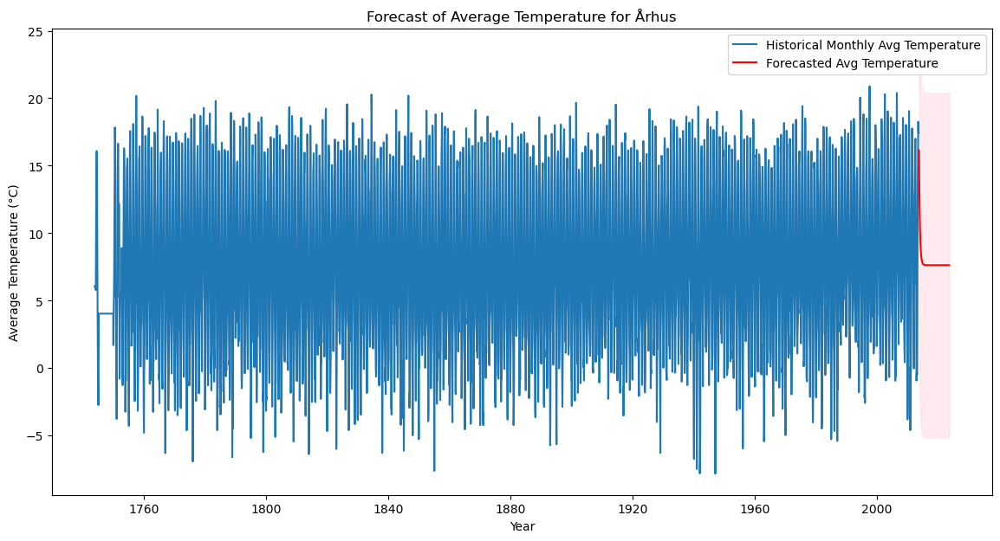

In [13]:
# Convert the forecast index to datetime if not already
forecast_df.index = pd.to_datetime(forecast_df.index)

# Try plotting again
plt.figure(figsize=(14, 7))
plt.plot(arhus_data_monthly, label='Historical Monthly Avg Temperature')
plt.plot(forecast_df['mean'], label='Forecasted Avg Temperature', color='red')
plt.fill_between(forecast_df.index, forecast_df['mean_ci_lower'], forecast_df['mean_ci_upper'], color='pink', alpha=0.3)
plt.title('Forecast of Average Temperature for Århus')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.legend()
plt.show()


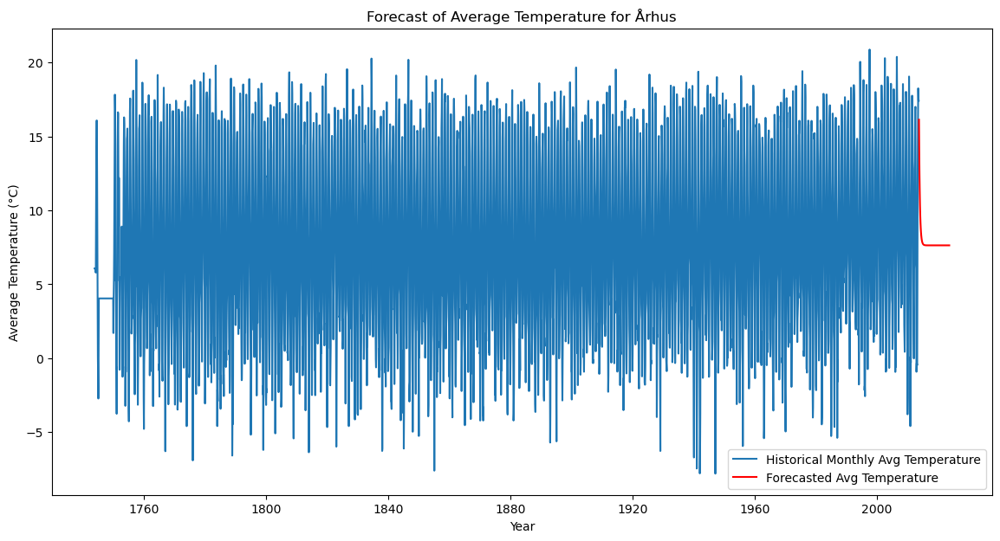

In [14]:
# Plotting the forecast without the confidence intervals
plt.figure(figsize=(14, 7))
plt.plot(arhus_data_monthly, label='Historical Monthly Avg Temperature')
plt.plot(forecast_df['mean'], label='Forecasted Avg Temperature', color='red')
plt.title('Forecast of Average Temperature for Århus')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.legend()
plt.show()


In [20]:
# Display the numerical summary of the forecast
forecast_df[['mean', 'mean_ci_lower', 'mean_ci_upper']]


AverageTemperature,mean,mean_ci_lower,mean_ci_upper
1784-09-30,17.017817,11.759541,22.276093
1784-10-31,15.701290,7.425269,23.977311
1784-11-30,14.725572,5.190032,24.261113
1784-12-31,14.002439,3.841290,24.163588
1785-01-31,13.466503,2.977589,23.955417
1785-02-28,13.069305,2.404643,23.733967
1785-03-31,12.774929,2.014955,23.534903
1785-04-30,12.556759,1.744790,23.368728
1785-05-31,12.395066,1.554644,23.235488
1785-06-30,12.275231,1.419212,23.131250


/Users/anuragmishra/miniforge3/envs/embedding2/lib/python3.10/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['alpha']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


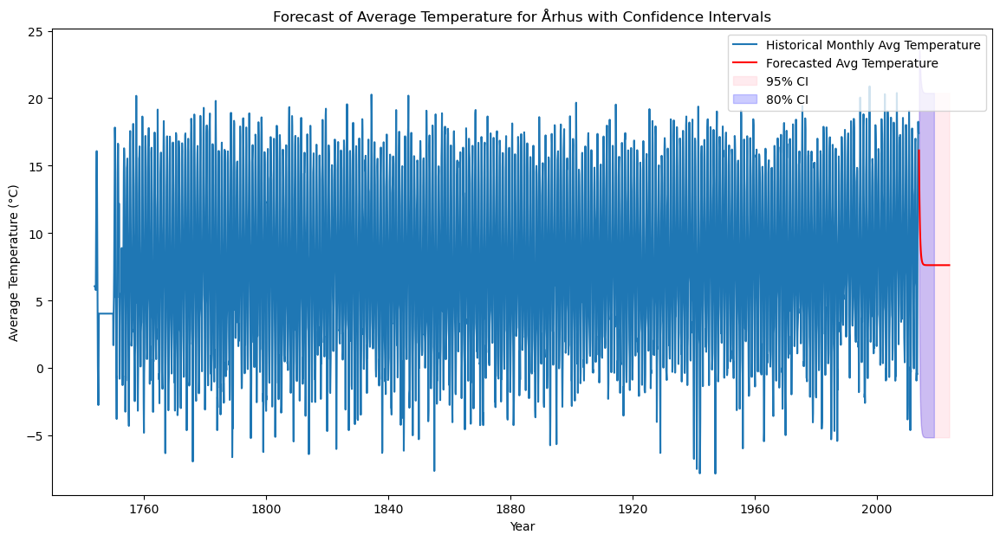

In [16]:
# Generate additional forecast with 80% confidence interval
forecast_80 = model_fit.get_forecast(steps=60, alpha=0.2)  # 80% CI
forecast_80_df = forecast_80.summary_frame()

# Plotting the forecast with both 95% and 80% confidence intervals
plt.figure(figsize=(14, 7))
plt.plot(arhus_data_monthly, label='Historical Monthly Avg Temperature')
plt.plot(forecast_df['mean'], label='Forecasted Avg Temperature', color='red')

# 95% confidence interval
plt.fill_between(forecast_df.index, forecast_df['mean_ci_lower'], forecast_df['mean_ci_upper'], color='pink', alpha=0.3, label='95% CI')

# 80% confidence interval
plt.fill_between(forecast_80_df.index, forecast_80_df['mean_ci_lower'], forecast_80_df['mean_ci_upper'], color='blue', alpha=0.2, label='80% CI')

plt.title('Forecast of Average Temperature for Århus with Confidence Intervals')
plt.xlabel('Year')
plt.ylabel('Average Temperature (°C)')
plt.legend()
plt.show()


/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  city_data = city_data.fillna(method='ffill')  # Forward fill missing values
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
/var/folders/3y/7ytf8jc57_9cg0hs2yk71rpm0000gn/T/ipykernel_60692/3395918843.py:14: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future ver

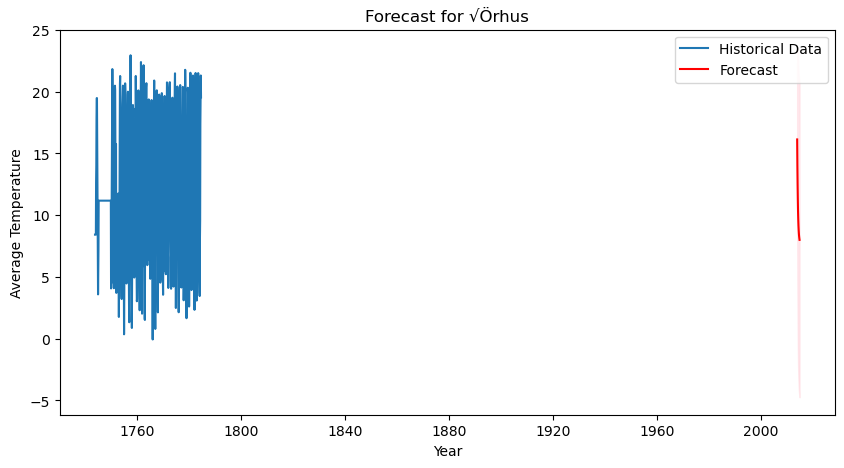

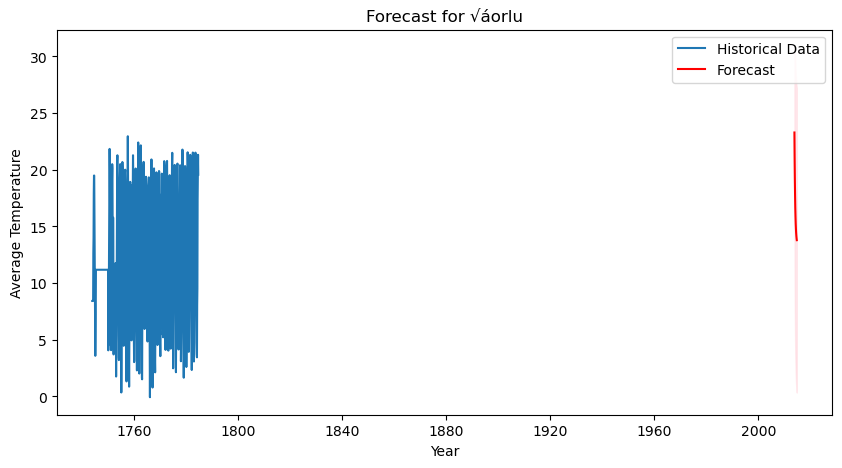

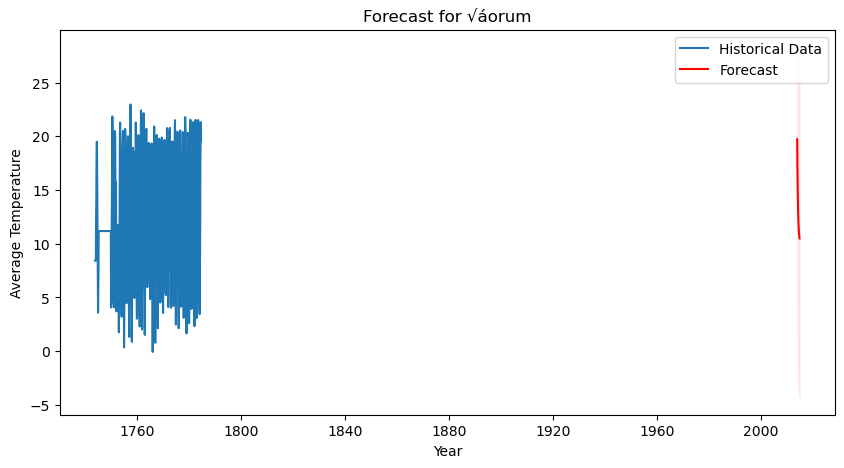

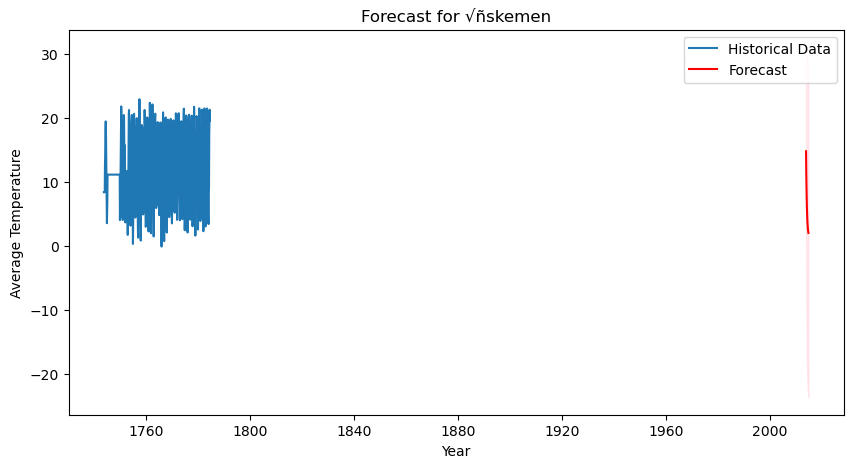

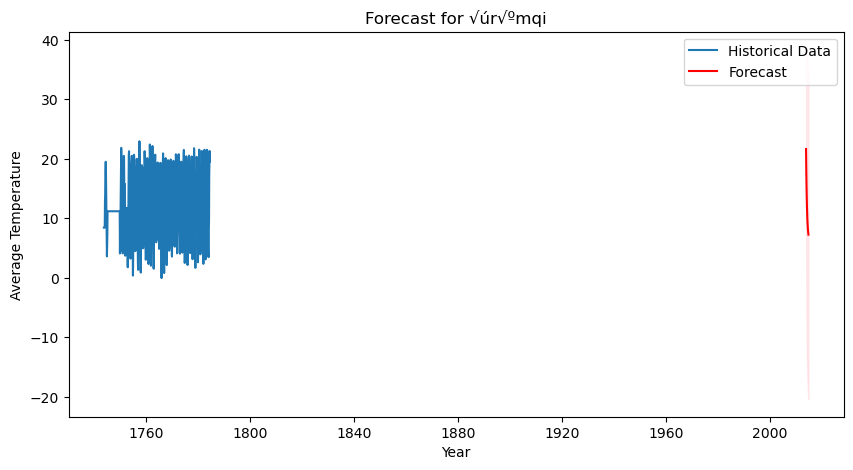

...

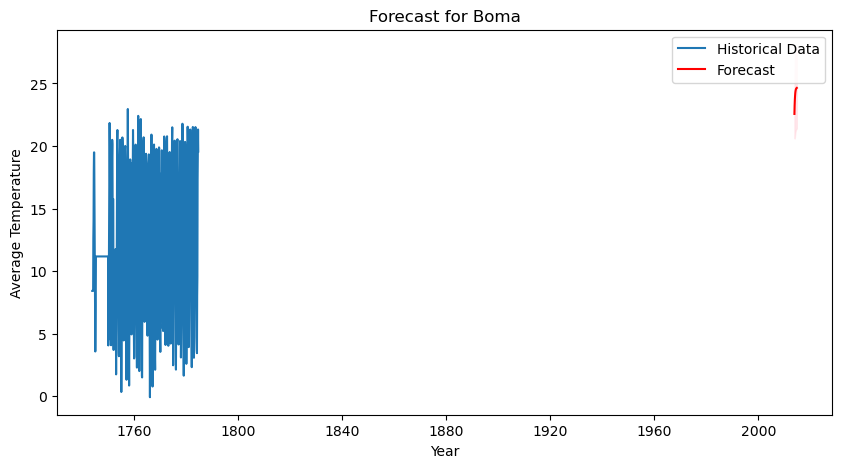

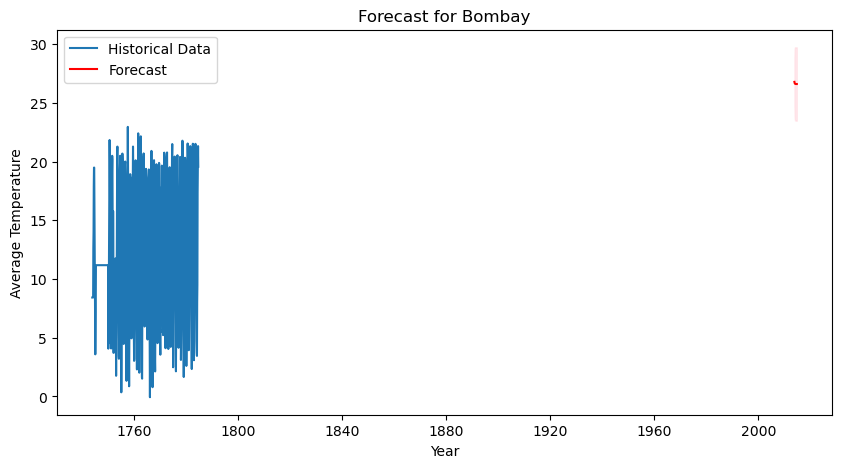

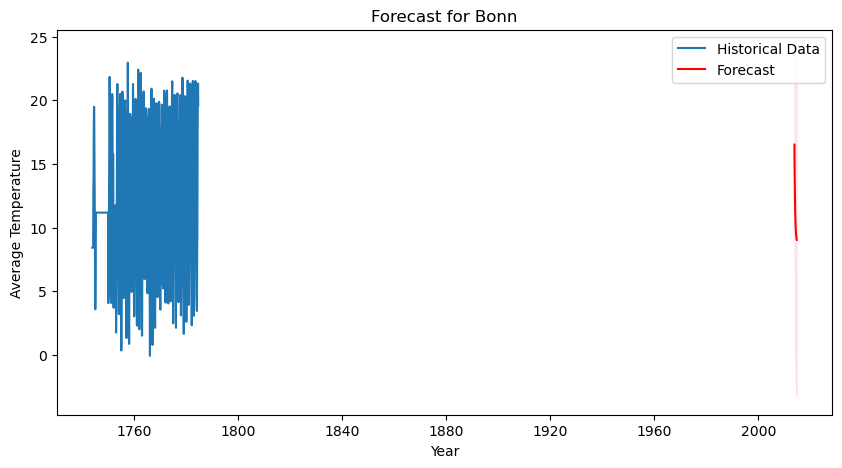

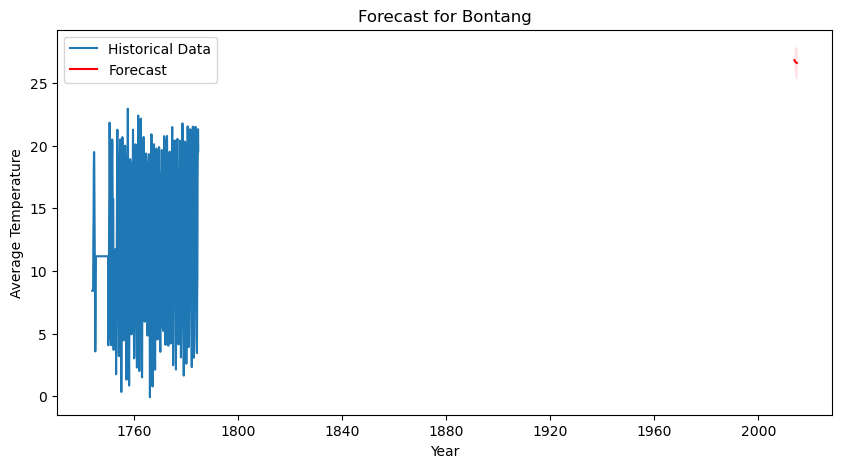

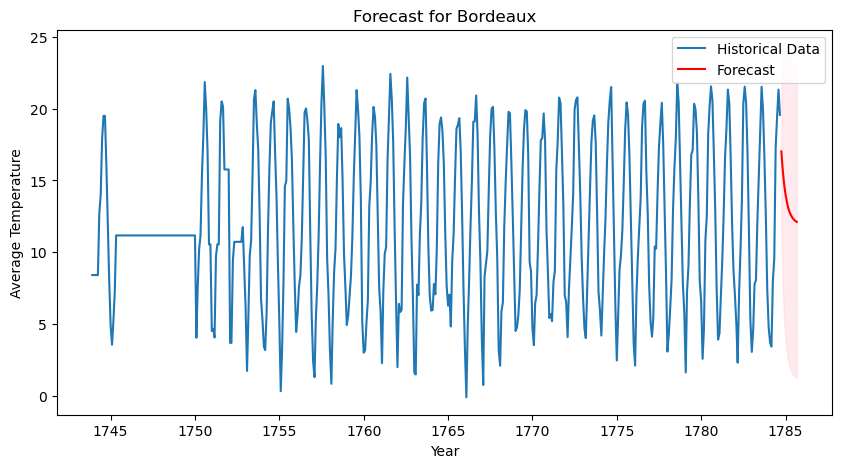

In [17]:
# Preprocess data
data['dt'] = pd.to_datetime(data['dt'])
data.set_index('dt', inplace=True)

# Filter cities
cities = data['City'].unique()

# Placeholder to store results
forecasts = {}

for city in cities:
    city_data = data[data['City'] == city]
    city_data = city_data['AverageTemperature'].resample('M').mean()  # Monthly average
    city_data = city_data.fillna(method='ffill')  # Forward fill missing values

    # Fit ARIMA model (you might want to customize p, d, q based on city-specific diagnostics)
    model = ARIMA(city_data, order=(1, 0, 1))
    model_fit = model.fit()

    # Forecast the next 12 months
    forecast = model_fit.get_forecast(steps=60)
    forecasts[city] = forecast.summary_frame()

# Optional: Save or plot results
for city, forecast_df in forecasts.items():
    plt.figure(figsize=(10, 5))
    plt.plot(city_data, label='Historical Data')
    plt.plot(forecast_df['mean'], label='Forecast', color='red')
    plt.fill_between(forecast_df.index, forecast_df['mean_ci_lower'], forecast_df['mean_ci_upper'], color='pink', alpha=0.3)
    plt.title(f'Forecast for {city}')
    plt.xlabel('Year')
    plt.ylabel('Average Temperature')
    plt.legend()
    plt.show()

In [21]:
# Corelation of Co2 and Avwerage global temp

In [ ]:
#data imputataion , to have co2 back in time
# 